# Audio Hardware/Sensor Design & Data Collection

**Task:** create a semi smart acquisition platform for sound data. This platform logs to file the time stamped RMS amplitude of its surrounding sound environment continuously. It collects audio files, but only those with sufficient amplitude above the ambient amplitude. Each audio file is atleast 1 second.
<br><br>
The data is captured over 12 hour period, from outdoor environment in increase variation in the sound sources. 

   * This code explains all of the possible sources of error and inaccuracies also description of the average acoustic conditions around the system
   <br><br>
   * Plot of all RMS amplitude data, (without resorting to plotting the entire dataset) and comment on its temporal evolution 
   <br><br>
   * Selection of few interesting captured audio recordings and for each:
       * Plot of its time domain representation and comment on its amplitude evolution
       * Plot of the Fourier Transform of the entire file using a logarithmic X-axis and comment on it
       * Plot of its spectrogram with time in seconds on the X-axis and comment on it
       * Labeled plots by using the correct variable and format for each scale, eg. time in seconds, frequency in Hz, etc.

**Notes:**
   * The active/auto noise cancellation settings on recording device(Mac Book) was turned off
   * The microphones input gain was adjusted so that distorted signal is not recorded or detected
   * Number of test recordings of RMS data and audio were analysed so as to ensure the system is functional and collecting usable data before beginning the extended recording period
   * All code must be clearly commented 
<br><br>

**I can be contacted at: ssp501@nyu.edu or svarmit@gmail.com**

# Project Code Starts Here

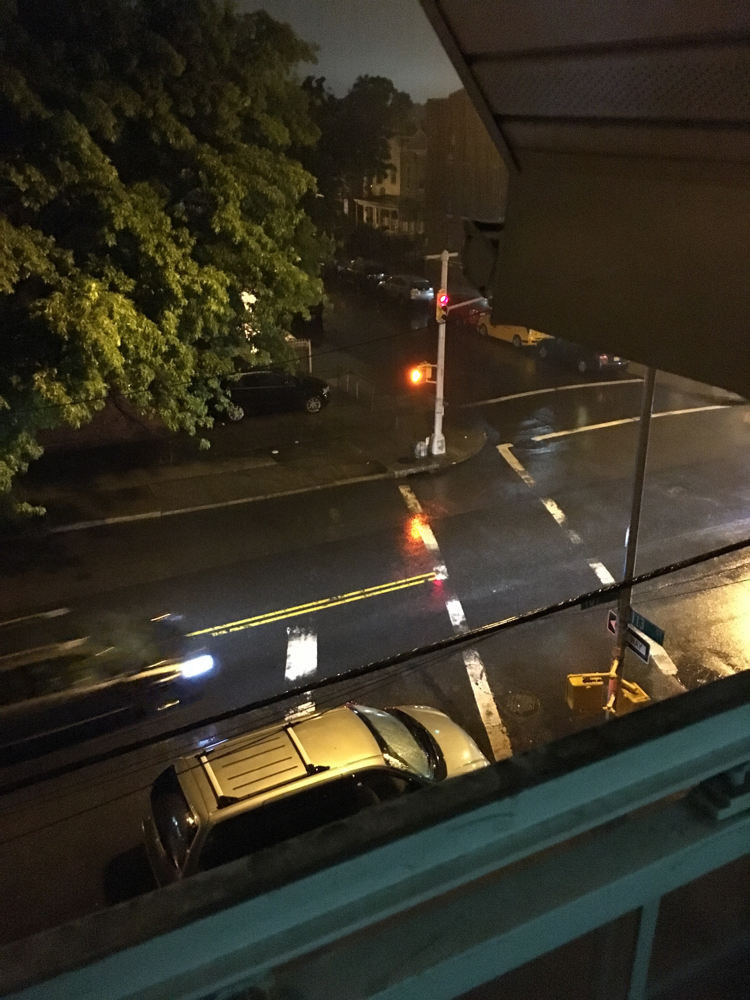

In [1]:
# Images of the window where mic sensor was placed.
from IPython.display import Image
Image(filename='IMG_1447.JPG')


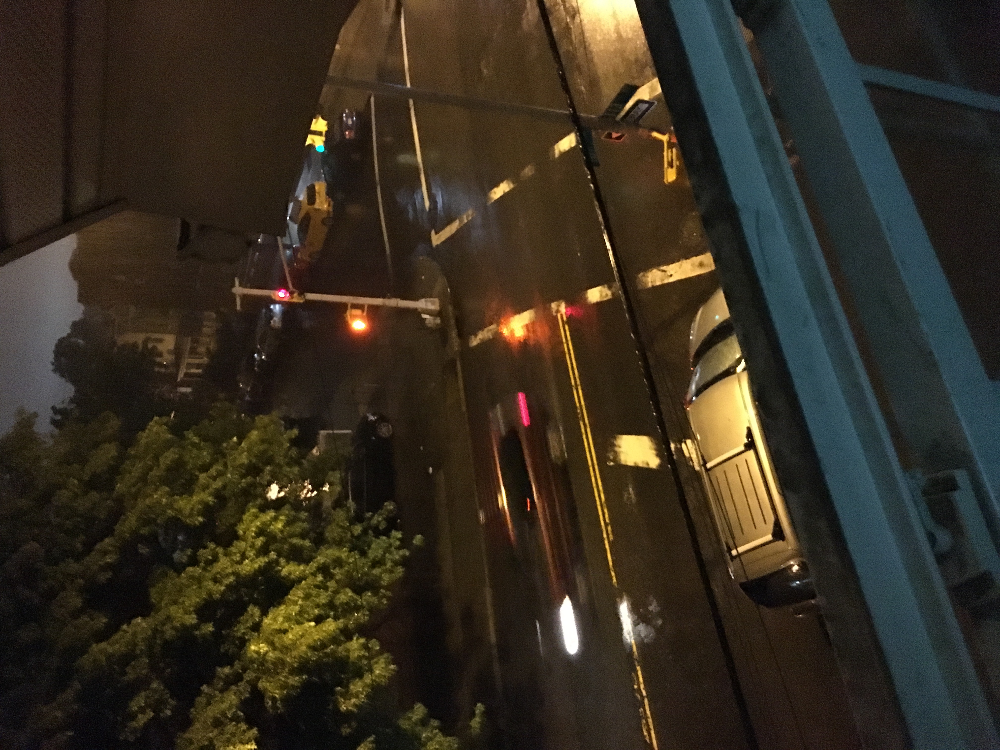

In [2]:
Image(filename='IMG_1448.JPG')

The sensor was placed at the 2nd floor of the residential building near the window facing the street.
across the street there is bus stop for Q8(24hours) MTA bus service and normally there is very low traffic in night and moderate traffic during peak hours.
There is no playground or children specific activities nor there are commercial buildings and there is no construction going on nearby. So most of the data that will be collected is from the activities happening on the street.


### Audio Recording Script
The Recoding python script("audio_record.py") is triggered using unix shell and that script is kept running for 12 hours. Every time there is audio signal about set threshold* the recording begins till the time audio remains above threshold or at least 1 second (which ever is smaller). rms of all the recordings above set threshold along with timestamp are written to csv file("rms_timestamp.csv")


### This code is used for analysis of the recorded rms and timestamp and the specific analysis of few significant sound sources

In [3]:
# Calling all necessary liberaries
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
%matplotlib inline
import numpy as np
from scipy.io import wavfile
import mpld3


In [4]:
df = pd.read_csv('rms_timestamp.csv')

In [5]:
df.columns = ['rms','timestamp']

In [6]:
t=datetime.fromtimestamp(df.timestamp[df.index==1])

In [7]:
df['datetime'] = pd.to_datetime(df["timestamp"], unit='s')

In [8]:
min(df.datetime)

Timestamp('2016-06-01 06:24:02.280000')

<function matplotlib.pyplot.tight_layout>

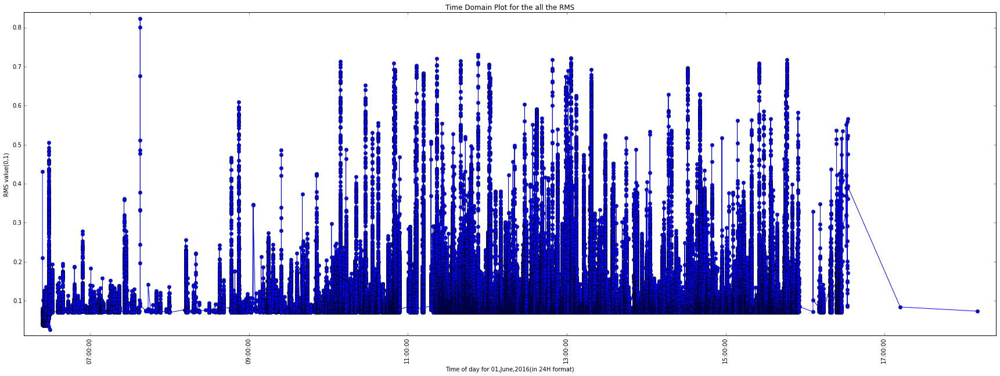

In [9]:
plt.figure(figsize=(30,10))
plt.plot(df.datetime,df.rms,marker='o',c='b')
plt.ylabel('RMS value(0,1)')
plt.xlabel('Time of day for 01,June,2016(in 24H format)')
plt.title('Time Domain Plot for the all the RMS')
plt.setp(plt.xticks()[1], rotation=90)
plt.margins(0.02)
plt.tight_layout


### Selection of audio sample for analysis.

On listening to many samples and looking through the above time domain plot I am considering the file "1464778410.7.wav" for analysis. This loud audio is identical to loud truck which was waiting at red light and later crossed the traffic signal with very loud noise. However, it was loud enough that my sensor was able to record continuous audio for 6.50 minutes.



In [10]:
# Fetching the freequency and sample from wave file
fs, samples = wavfile.read('1464778410.7.wav')

In [11]:
# Checking the length of sample
len(samples)

18102272

In [12]:
# There are 18102272  samples so plotting only first 100000 of these in the fig-1 and 10000 in fig-2

<function matplotlib.pyplot.tight_layout>

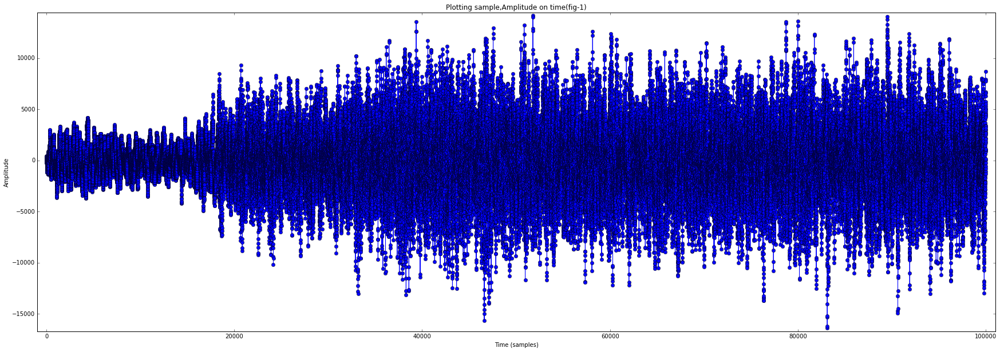

In [13]:
# Plotting the Amplitude of sound on the time.
plt.figure(figsize=(30,10))
plt.plot(samples[0:100000], marker='o')
plt.title('Plotting sample,Amplitude on time(fig-1)')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.margins(0.01)
plt.tight_layout

<function matplotlib.pyplot.tight_layout>

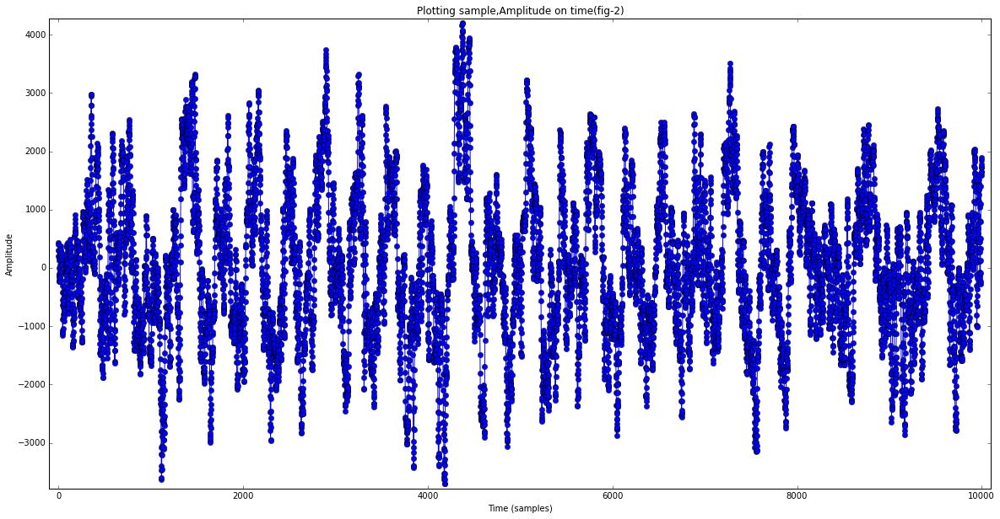

In [14]:
# Plotting the time domain plot for the selected audio.
plt.figure(figsize=(20,10))
plt.plot(samples[0:10000], marker='o')
plt.title('Plotting sample,Amplitude on time(fig-2)')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.margins(0.01)
plt.tight_layout

In [15]:
#Deviding by 32768 to convert sample to -1 to 1 range/ To normalize
samples = samples / 32768.0

In [16]:
# Printing samples to verify the values 
print(samples)

array([ 0.01312256,  0.01217651,  0.00930786, ...,  0.07852173,
        0.05630493,  0.03634644])

### Plot the time domain representation and comments on its amplitude evolution

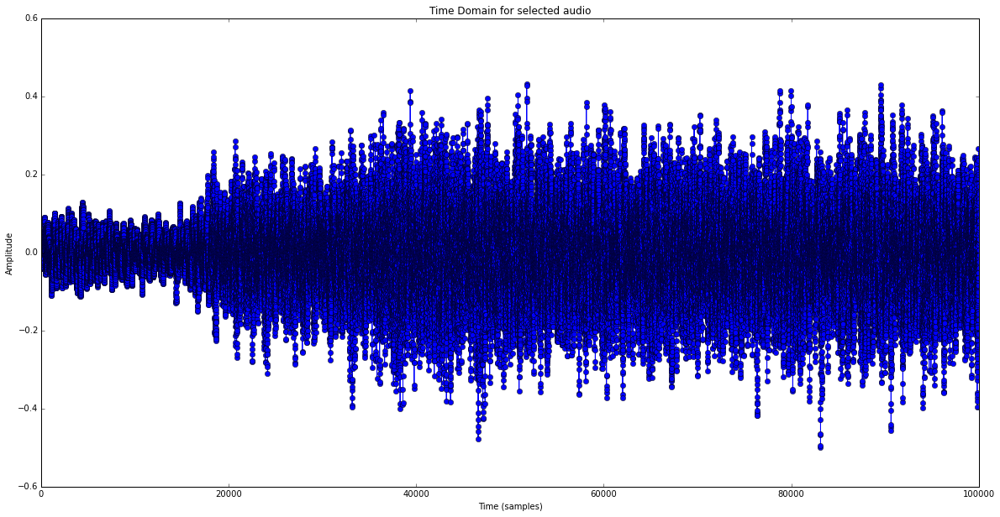

In [17]:
# Again plotting the Amplitude of sound on the time.

plt.figure(figsize=(20,10))
plt.plot(samples[0:100000], marker='o')
plt.title('Time Domain for selected audio')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')





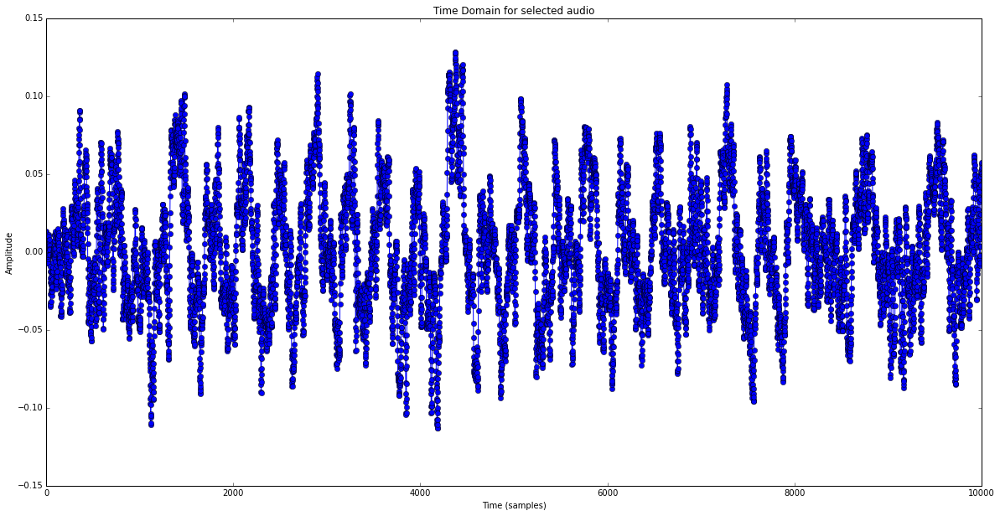

In [18]:
# Again plotting the time domain plot for the selected audio.

plt.figure(figsize=(20,10))
plt.plot(samples[0:10000], marker='o')
plt.title('Time Domain for selected audio')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')

### Plotting the Fourier Transform of the entire file using a logarithmic X-axis 

In [19]:
# taking Fourier Transform of samples in variable dft_output
fs, samples = wavfile.read('1464778410.7.wav')
s=samples.astype(float)
dft_output = np.fft.rfft(s)
print(dft_output[1])


(814969.827645+2219189.0536j)


The Fourier transform is complex numbmber so extracting only magnitudes out of this

In [21]:
# Extracting only maginitude
magnitude_spectrum = [np.sqrt(i.real**2 + i.imag**2)/len(dft_output) for i in dft_output]

In [22]:
# Printing the magnitude for second element
magnitude_spectrum[1]

0.2611938692730616

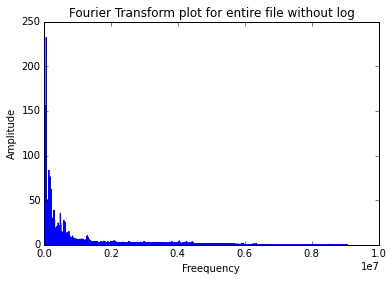

In [23]:
#Plotting the magnitude of fourier transform without log
plt.plot(magnitude_spectrum)
plt.title('Fourier Transform plot for entire file without log')
plt.xlabel('Freequency')
plt.ylabel('Amplitude')


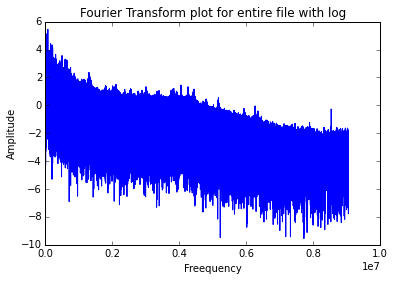

In [24]:
# Plotting the Fourier Transform plot for entire file with log
plt.plot(np.log(magnitude_spectrum))
plt.title('Fourier Transform plot for entire file with log')
plt.xlabel('Freequency')
plt.ylabel('Amplitude')


The overall amplitude of the sound has decreased with the time which was expected as the truck arrived near the sensor and then it has moved away with the time.


### Spectrogram
A spectrogram is a visual representation of the spectrum of frequencies in a sound or other signal as they vary with time or some other variable. Spectrograms are sometimes called spectral waterfalls, voiceprints, or voicegrams.



In [25]:
## Fetching sample and freequency again for plotting the spectrogram
fs, samples = wavfile.read('1464778410.7.wav')

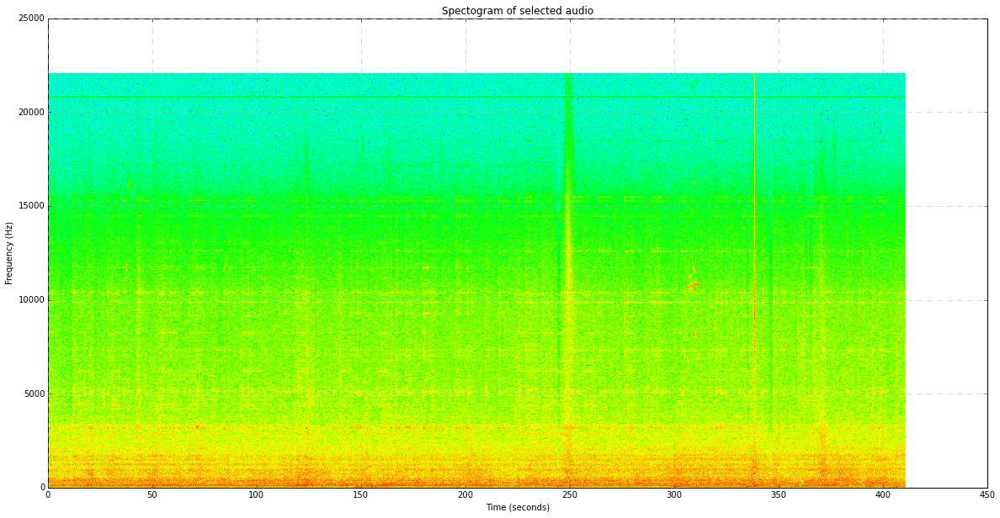

In [26]:
# Plotting spectrogram
window_size = 2048
plt.figure(figsize=(20,10))
plt.specgram(samples, NFFT = window_size,  Fs = fs, mode = 'magnitude');
plt.set_cmap('gist_rainbow_r')
plt.title('Spectogram of Audio recording of truck')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Hz)')
plt.grid(b=True, which='both', color='0.7',linestyle='--')

In [3]:
#max(df.datetime)-min(df.datetime)

 As most of the orange color is till 5000Hz frequency so plotting spectrogram again for max freequency of 5000

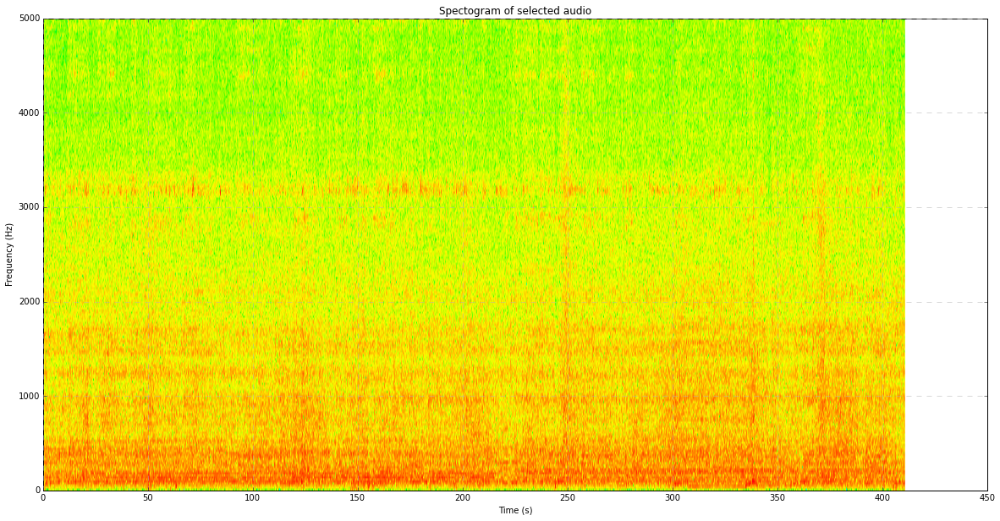

In [28]:
# Spectrogram for max freequency = 5000
window_size = 2048
plt.figure(figsize=(20,10))
plt.specgram(samples, NFFT = window_size,  Fs = fs, mode = 'magnitude');
plt.ylim(0,5000)
plt.set_cmap('gist_rainbow_r')
plt.title('Spectogram of selected audio')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.grid(b=True, which='both', color='0.7',linestyle='--')

### Spectrogram analysis
For this audio the amplitude of the frequencies for the time period of 410 seconds remain consistent with periodic high amplitude (near frequency 3000 to 3400) which can be due to the vibration sound created by the engine of the Truck. There is a peak at nearly 250 seconds which can be due to the acceleration noise created by truck.


### The second intersting audio is complete audio of MTA bus arriving at bus stop(few steps away from audio sensor ) waiting for passengers to board and finally departing from stop. 
Name of the file:1464794032.98.wave, Time of recodrding 11am 1,June,2016

In [29]:
# Extractinf freequency and samples from the audio of MTA bus
fs, samples = wavfile.read('1464794032.98.wav')
len(samples)

1366016

<function matplotlib.pyplot.tight_layout>

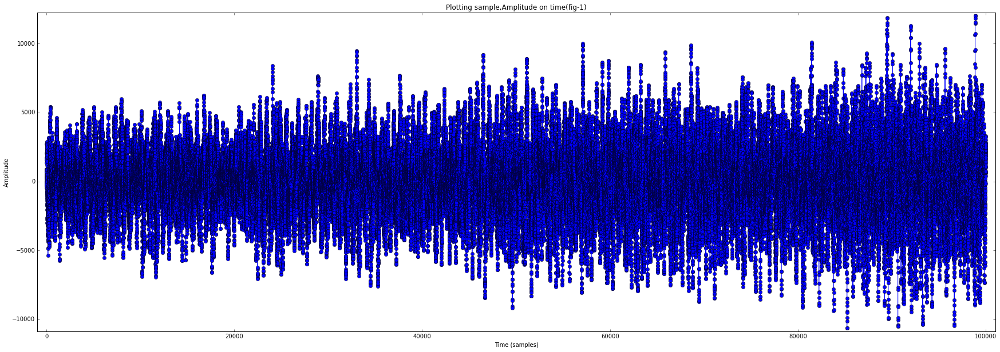

In [30]:
# Plotting the Amplitude of sound on the time.
plt.figure(figsize=(30,10))
plt.plot(samples[0:100000], marker='o')
plt.title('Plotting sample,Amplitude on time(fig-1)')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.margins(0.01)
plt.tight_layout

<function matplotlib.pyplot.tight_layout>

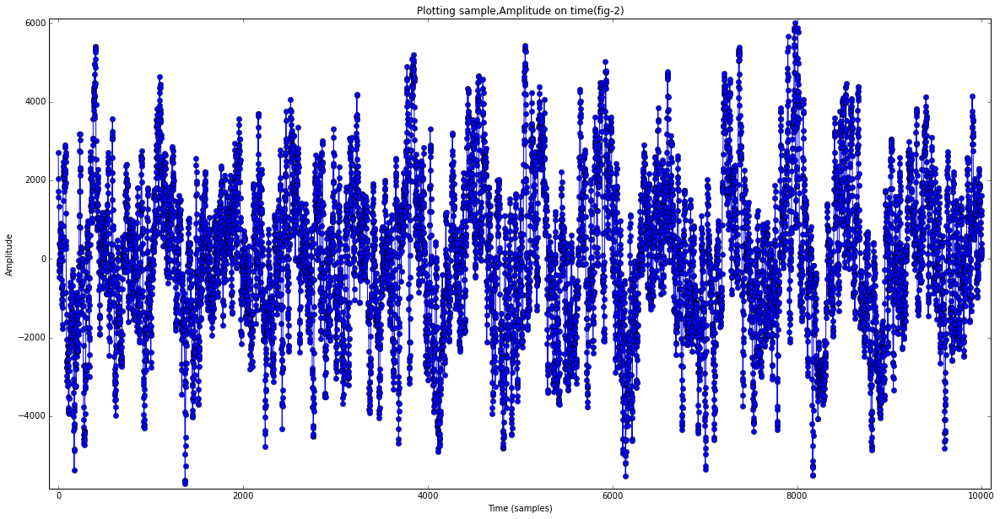

In [31]:
# Plotting the time domain plot for the selected audio.
plt.figure(figsize=(20,10))
plt.plot(samples[0:10000], marker='o')
plt.title('Plotting sample,Amplitude on time(fig-2)')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.margins(0.01)
plt.tight_layout

In [32]:
#Deviding by 32768 to convert sample to -1 to 1 range
samples = samples / 32768.0

Plot its time domain representation and comment on its amplitude evolution¶

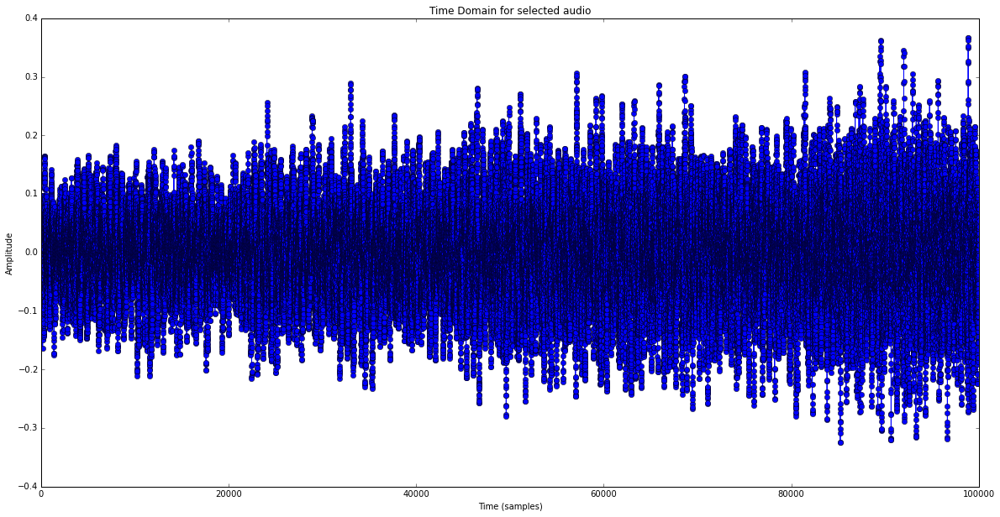

In [33]:
# Plotting again with new samples (between -1 to 1)
plt.figure(figsize=(20,10))
plt.plot(samples[0:100000], marker='o')
plt.title('Time Domain for selected audio')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')

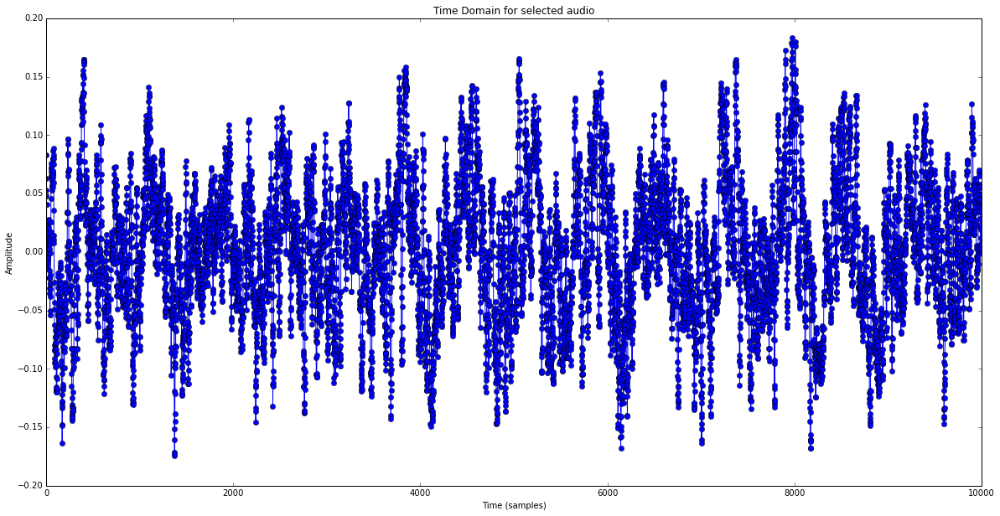

In [34]:
plt.figure(figsize=(20,10))
plt.plot(samples[0:10000], marker='o')
plt.title('Time Domain for selected audio')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')

Plot the Fourier Transform of the entire file using a logarithmic X-axis and comment on it

In [35]:
# Taking Fourier Transform of samples in variable dft_output
fs, samples = wavfile.read('1464794032.98.wav')
s=samples.astype(float)
dft_output = np.fft.rfft(s)
print(dft_output[1])


(-407046.934074-287843.078319j)


In [36]:
# Extracting only magnitude from the spectrum which is complext number
magnitude_spectrum = [np.sqrt(i.real**2 + i.imag**2)/len(dft_output) for i in dft_output]
print (magnitude_spectrum[1])

0.729915285015


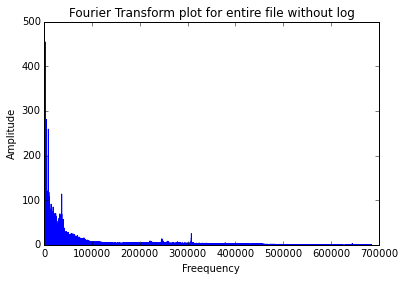

In [37]:
#Plotting the magnitude of fourier transform
plt.plot(magnitude_spectrum)
plt.title('Fourier Transform plot for entire file without log')
plt.xlabel('Freequency')
plt.ylabel('Amplitude')


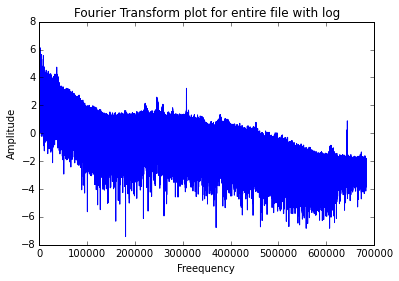

In [38]:
# Plotting the log magnitude
plt.plot(np.log(magnitude_spectrum))
plt.title('Fourier Transform plot for entire file with log')
plt.xlabel('Freequency')
plt.ylabel('Amplitude')

The trend of amplitude is as expected as when the bus arrives near the sensor the amplitude is high and amplitude started decreasing as the bus stopped at the stop and then the amplitude increased with the sound of acceleration of the bus while departing the stop. The high peak near the 300000 (on x-axis) might be due to the high pitch sound of either releasing breaks or release of air pressure, when bus start accelerating.


In [39]:
# Extracting freequency and sample  for spectrogram
fs, samples = wavfile.read('1464794032.98.wav')

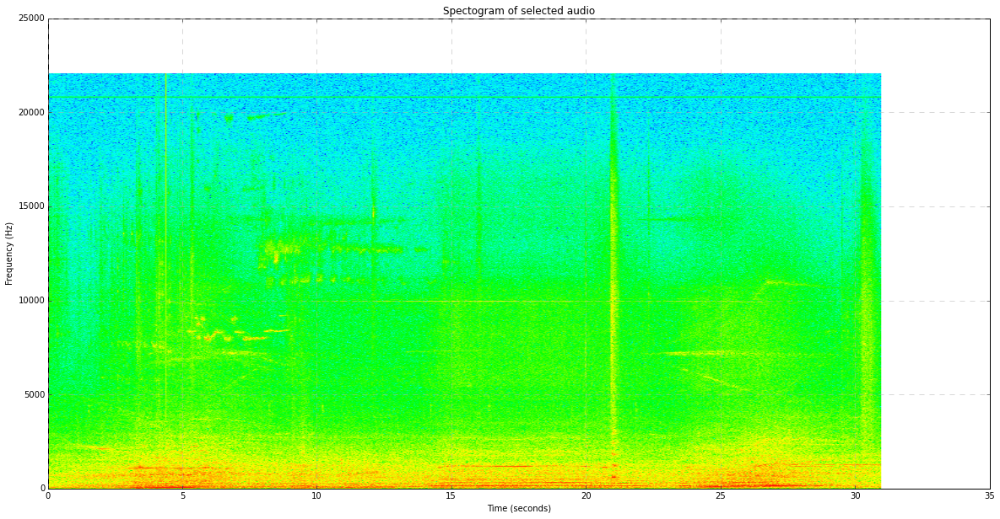

In [40]:
# Creating Spectrogram for all the Freequency 
window_size = 2048
plt.figure(figsize=(20,10))
plt.specgram(samples, NFFT = window_size,  Fs = fs, mode = 'magnitude');
plt.set_cmap('gist_rainbow_r')
plt.title('Spectogram of selected audio')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Hz)')
plt.grid(b=True, which='both', color='0.7',linestyle='--')

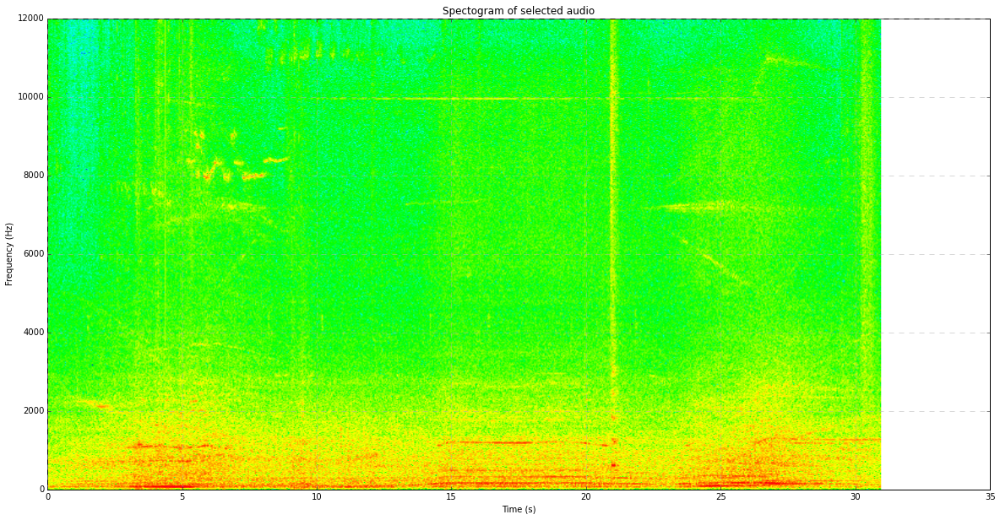

In [41]:
### Changing Y axis for better visual analysisi by limiting it to 12000
window_size = 2048
plt.figure(figsize=(20,10))
plt.specgram(samples, NFFT = window_size,  Fs = fs, mode = 'magnitude');
plt.ylim(0,12000)
plt.set_cmap('gist_rainbow_r')
plt.title('Spectogram of selected audio')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.grid(b=True, which='both', color='0.7',linestyle='--')

The horizontal straight lines in the spectrogram might be due to horn or other continuous sound generated that can be of sound generated when the front shocker of bus is compressed for reducing the height of entrance door of bus.

There is evidence of high frequency audio in between 5-10 seconds that is due to the sharp noise generated by bus when brakes are applied


**End Notes: **

This project can be extended further for audio analyis at many locations by tunning the threshold accordingly. More over this can be extended further for prediction of the audio source by training the model about the audio sources.
